# Swin Transformer

In [1]:
import pandas as pd
import torch

In [2]:
# Load the data
df = pd.read_csv('./faces/fold_0_data.txt', sep="\t")

In [3]:
print(df.shape)
print(df.columns)
df.head()

(4484, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [4]:
# Load the other dataframes
df1 = pd.read_csv('./faces/fold_1_data.txt', sep="\t")
df2 = pd.read_csv('./faces/fold_2_data.txt', sep="\t")
df3 = pd.read_csv('./faces/fold_3_data.txt', sep="\t")
df4 = pd.read_csv('./faces/fold_4_data.txt', sep="\t")

# Concatenate all the dataframes
df = pd.concat([df, df1, df2, df3, df4]).reset_index(drop=True)

In [5]:
print(df.shape)
print(df.columns)
df.head()

(19370, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [6]:
# Create a new column with the path to the images
df['path'] = df['user_id'] + '/' + "coarse_tilt_aligned_face." + df['face_id'].astype(str) + "." + df['original_image']
df['path'].head()

0    30601258@N03/coarse_tilt_aligned_face.1.103996...
1    30601258@N03/coarse_tilt_aligned_face.2.104248...
2    30601258@N03/coarse_tilt_aligned_face.1.104379...
3    30601258@N03/coarse_tilt_aligned_face.3.104379...
4    30601258@N03/coarse_tilt_aligned_face.2.118166...
Name: path, dtype: object

In [7]:
# drop duplicate images
df = df.drop_duplicates(subset=['path'], keep='first').reset_index(drop=True)

In [8]:
df.shape

(19370, 13)

In [9]:
df['gender'].value_counts()

gender
f    9372
m    8120
u    1099
Name: count, dtype: int64

In [10]:
# drop the rows with u or nan for gender
df = df[(df['gender'] != 'u') & (df['gender'].notnull())]
df['gender'].value_counts()

gender
f    9372
m    8120
Name: count, dtype: int64

In [11]:
# encode gender column as male
df['male'] = df['gender'].apply(lambda x: 1 if x == 'm' else 0)
df['male'].value_counts()

male
0    9372
1    8120
Name: count, dtype: int64

In [12]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from PIL import Image


dim = 224


class ImageDataset(Dataset):
  def __init__(self, annotations_df, img_dir, dim=dim, transform=None, target_transform=None):
    self.annotations_df = annotations_df
    self.img_dir = img_dir
    self.dim = dim
    self.transform = transform
    self.target_transform = target_transform

  def __len__(self):
    return len(self.annotations_df)

  def __getitem__(self, idx):
    img_path = os.path.join(self.img_dir, self.annotations_df.loc[idx, 'path'])
    # read the image and resize
    image = Image.open(img_path).convert("RGB")
    image = image.resize((self.dim, self.dim))
    image = ToTensor()(image)
    label = self.annotations_df.loc[idx, 'male']
    label = torch.tensor(label)
    if self.transform:
        image = self.transform(image, self.dim)
    if self.target_transform:
        label = self.target_transform(label)
    return image, label

In [13]:
from torchvision import transforms

def transform_image(image, dim):
  # data augmentation
  transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(dim, scale=(0.8, 1.0), ratio=(1.0,1.0)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
  ])
  return transform(image)

## 10000 datapoints: 8000 Train, 1000 Val, 1000 Test

In [14]:
# sample 10000 images, with an equal number of each gender
df_male = df[df['gender'] == 'm'].sample(n=5000, random_state=23)
df_female = df[df['gender'] == 'f'].sample(n=5000, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    5000
f    5000
Name: count, dtype: int64


In [15]:
# Get train, validation and test sets (80-10-10)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df_sampled, test_size=0.2, random_state=23)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [16]:
len(train_dataset), len(val_dataset), len(test_dataset)

(8000, 1000, 1000)

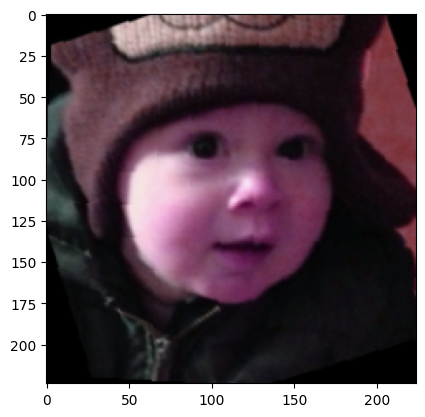

In [17]:
# show an image
image, label = train_dataset[1]
plt.imshow(image.permute(1, 2, 0))
plt.show()

In [18]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [19]:
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [20]:
# Load pretrained model
from torchvision.models import swin_t

swin_t = swin_t(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
swin_t.to(device)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=96, out_features=288, bias=True)
          (proj): Linear(in_features=96, out_features=96, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=96, out_features=384, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=384, out_features=96, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock(
       

In [21]:
# Check the number of parameters
total_params = sum([param.numel() for param in swin_t.parameters()])
print(f'{total_params:,} total parameters.')

27,520,892 total parameters.


In [22]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(swin_t.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [23]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  swin_t.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = swin_t(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  swin_t.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = swin_t(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(swin_t.state_dict(), 'swin_t.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.7270, Training Accuracy: 0.5101
Validation Loss: 0.6891, Validation Accuracy: 0.5230
===== Epoch 2 =====
Training Loss: 0.6992, Training Accuracy: 0.5248
Validation Loss: 0.6813, Validation Accuracy: 0.5910
===== Epoch 3 =====
Training Loss: 0.6960, Training Accuracy: 0.5357
Validation Loss: 0.7054, Validation Accuracy: 0.5030
===== Epoch 4 =====
Training Loss: 0.7033, Training Accuracy: 0.5095
Validation Loss: 0.6951, Validation Accuracy: 0.5080
===== Epoch 5 =====
Training Loss: 0.7002, Training Accuracy: 0.5056
Validation Loss: 0.7190, Validation Accuracy: 0.4920
===== Epoch 6 =====
Training Loss: 0.7008, Training Accuracy: 0.4993
Validation Loss: 0.6931, Validation Accuracy: 0.4900
===== Epoch 7 =====
Training Loss: 0.6972, Training Accuracy: 0.5029
Validation Loss: 0.6935, Validation Accuracy: 0.4920
Early stopping


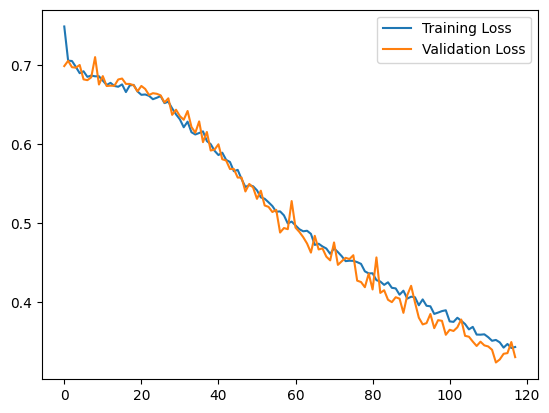

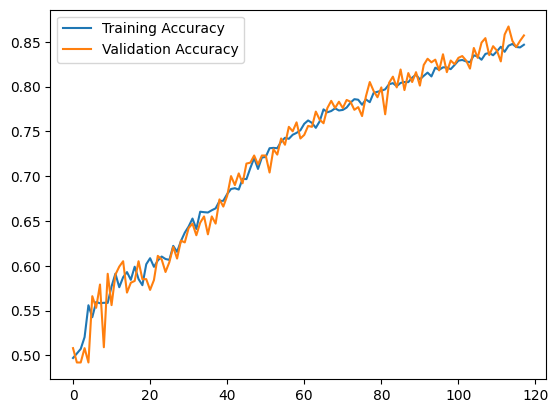

In [25]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_21384\2921267633.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  swin_v2_t.load_state_dict(torch.load('swin_v2_t.pth'))



Accuracy: 0.8470

F1-Score: 0.8468

Precision: 0.8483

Recall: 0.8470


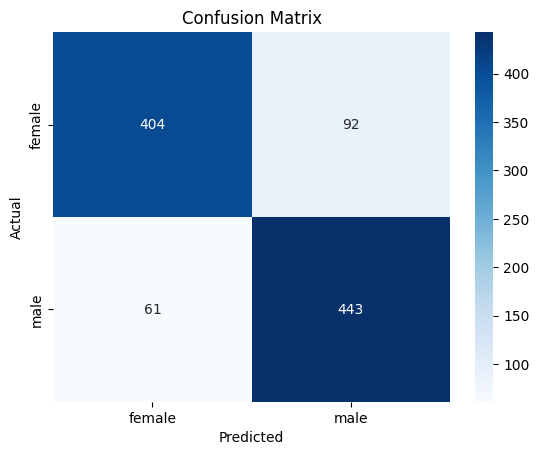

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
swin_t.load_state_dict(torch.load('swin_t.pth'))
swin_t.to(device)

swin_t.eval()
all_labels = []
all_predictions = []

with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = swin_t(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

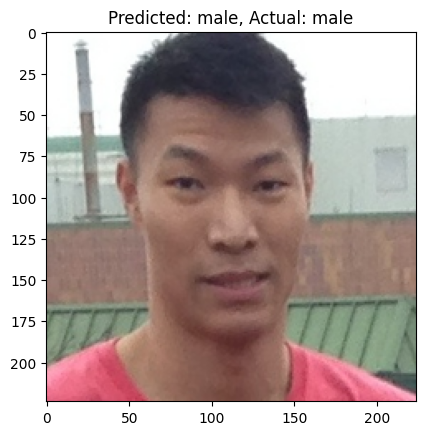

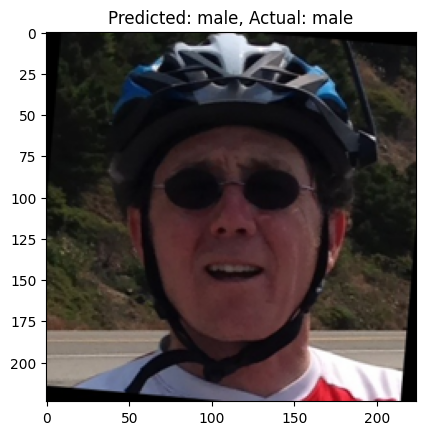

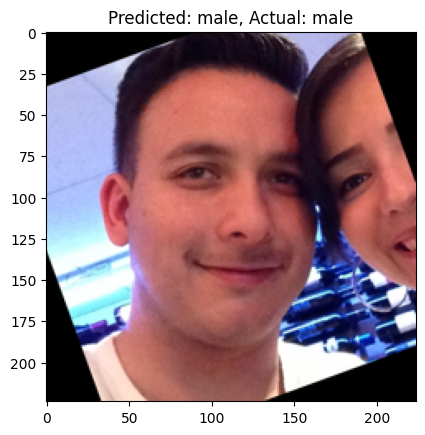

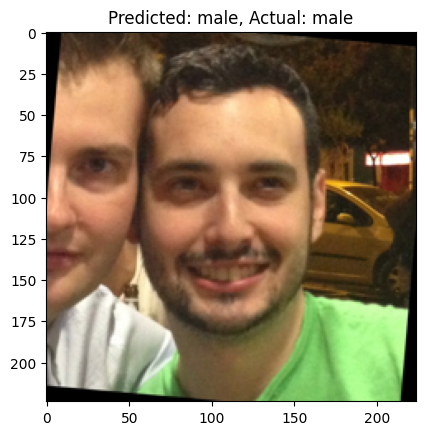

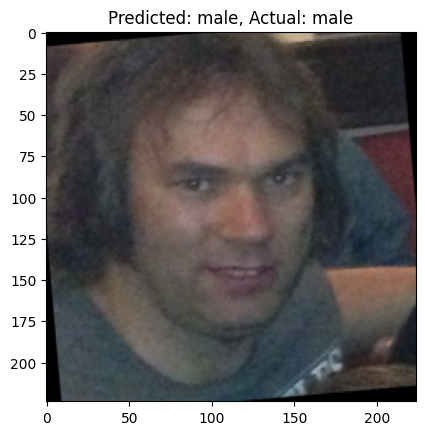

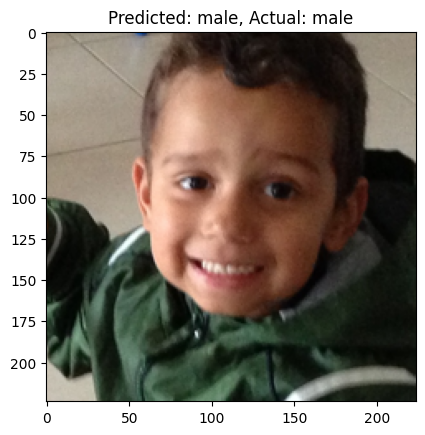

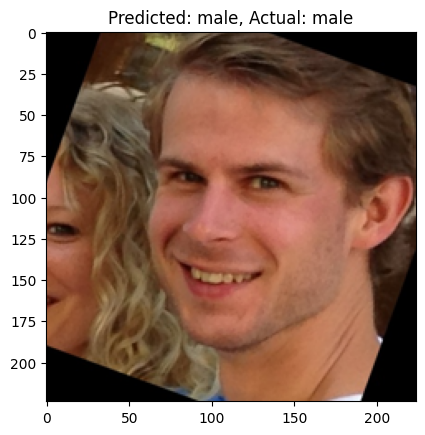

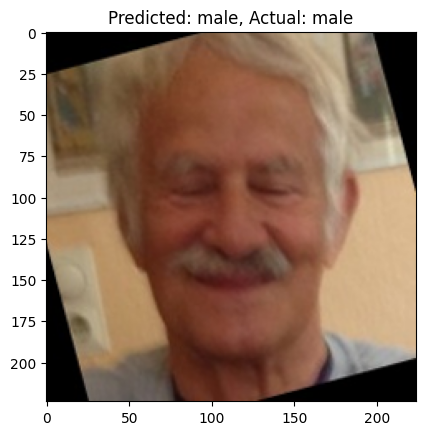

In [ ]:
# Show some predictions
swin_t.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = swin_t(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [20]:
# Load pretrained model
from torchvision.models import swin_v2_t, Swin_V2_T_Weights

swin_v2_t = swin_v2_t(weights=Swin_V2_T_Weights.IMAGENET1K_V1)

# Change to 2 classes
swin_v2_t.head = torch.nn.Linear(swin_v2_t.head.in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
swin_v2_t.to(device)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlockV2(
        (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttentionV2(
          (qkv): Linear(in_features=96, out_features=288, bias=True)
          (proj): Linear(in_features=96, out_features=96, bias=True)
          (cpb_mlp): Sequential(
            (0): Linear(in_features=2, out_features=512, bias=True)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=512, out_features=3, bias=False)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=96, out_features=384, bias=True)
          (1): GELU(approximate='

In [21]:
# Check the number of parameters
total_params = sum([param.numel() for param in swin_v2_t.parameters()])
print(f'{total_params:,} total parameters.')

27,584,108 total parameters.


In [22]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(swin_v2_t.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [23]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  swin_v2_t.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = swin_v2_t(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  swin_v2_t.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = swin_v2_t(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(swin_v2_t.state_dict(), 'swin_v2_t_finetune.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.3446, Training Accuracy: 0.8440
Validation Loss: 0.1856, Validation Accuracy: 0.9220
===== Epoch 2 =====
Training Loss: 0.2063, Training Accuracy: 0.9155
Validation Loss: 0.1520, Validation Accuracy: 0.9410
===== Epoch 3 =====
Training Loss: 0.1648, Training Accuracy: 0.9379
Validation Loss: 0.1223, Validation Accuracy: 0.9510
===== Epoch 4 =====
Training Loss: 0.1229, Training Accuracy: 0.9504
Validation Loss: 0.1423, Validation Accuracy: 0.9530
===== Epoch 5 =====
Training Loss: 0.1065, Training Accuracy: 0.9584
Validation Loss: 0.1013, Validation Accuracy: 0.9660
===== Epoch 6 =====
Training Loss: 0.0929, Training Accuracy: 0.9635
Validation Loss: 0.1157, Validation Accuracy: 0.9590
===== Epoch 7 =====
Training Loss: 0.0803, Training Accuracy: 0.9718
Validation Loss: 0.1038, Validation Accuracy: 0.9660
===== Epoch 8 =====
Training Loss: 0.0671, Training Accuracy: 0.9770
Validation Loss: 0.1105, Validation Accuracy: 0.9590
===== Epoch 9 =====
Trai

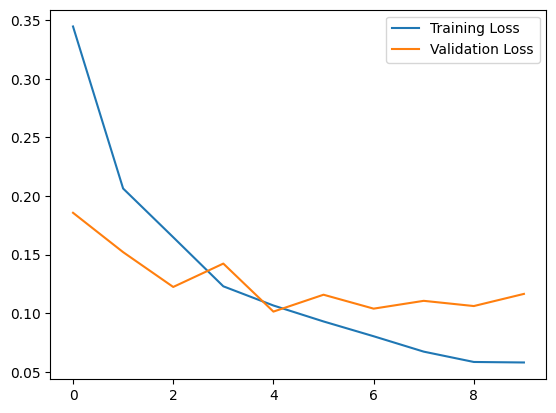

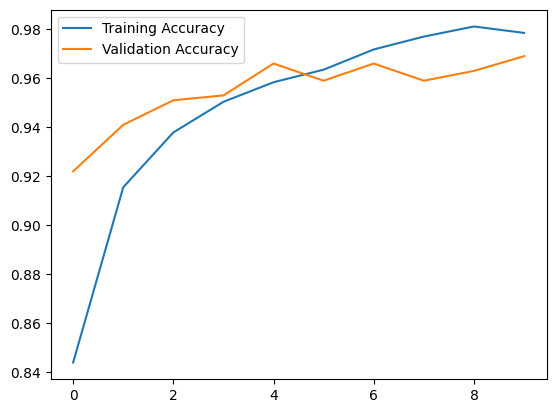

In [24]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_5852\3792351259.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  swin_v2_t.load_state_dict(torch.load('swin_v2_t_finetune.pth'


Accuracy: 0.9620

F1-Score: 0.9620

Precision: 0.9623

Recall: 0.9620


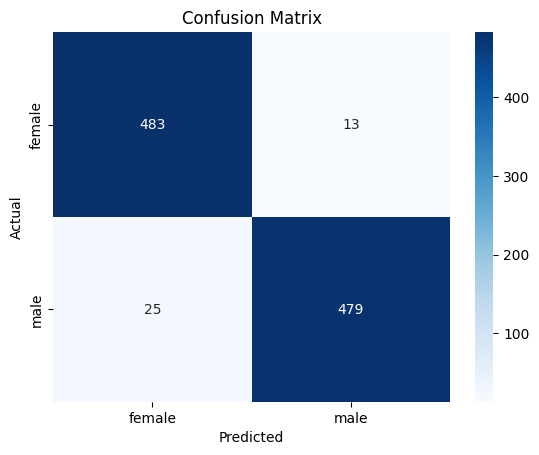

In [25]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
swin_v2_t.load_state_dict(torch.load('swin_v2_t_finetune.pth'))
swin_v2_t.to(device)

swin_v2_t.eval()
all_labels = []
all_predictions = []

with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = swin_v2_t(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

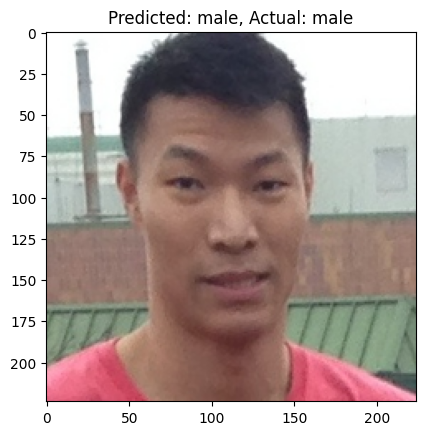

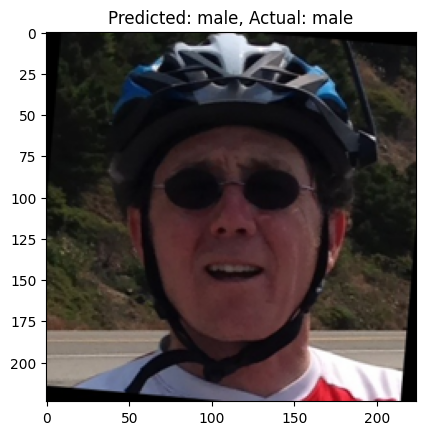

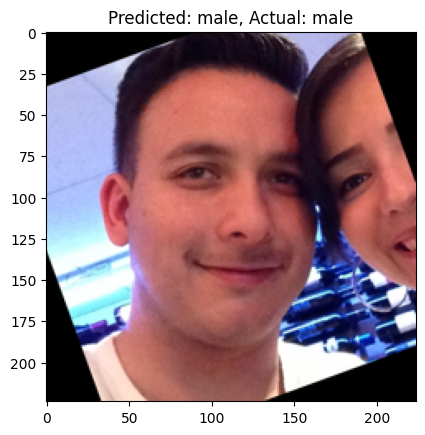

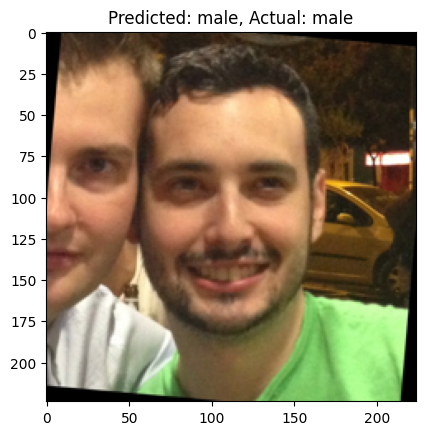

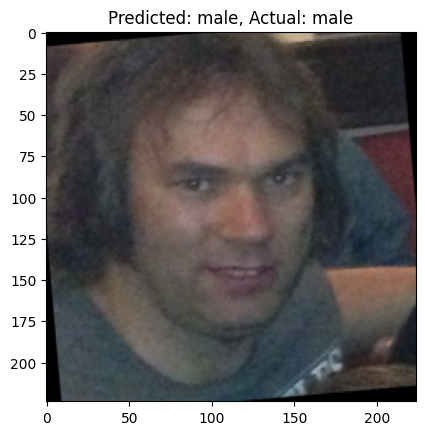

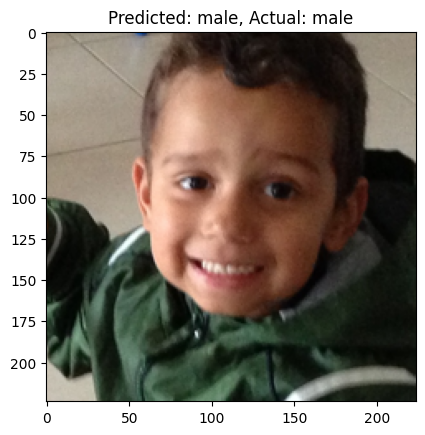

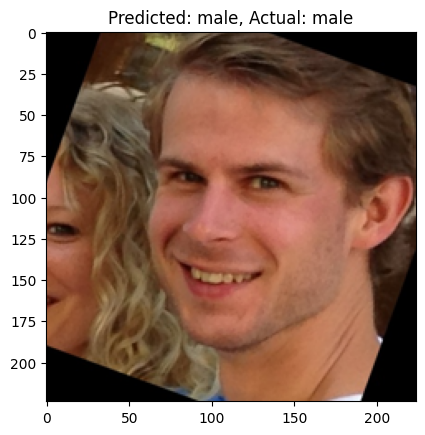

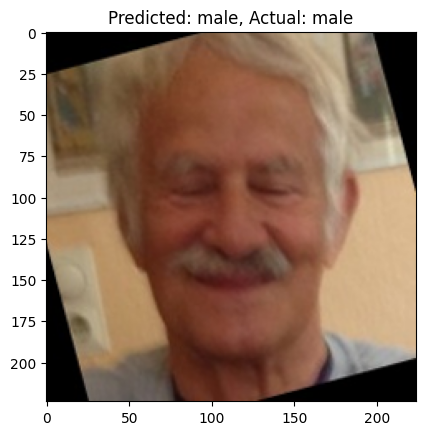

In [26]:
# Show some predictions
swin_v2_t.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = swin_v2_t(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## Less Training Data (4000 Train, 500 Val, Same 1000 Test data)

In [20]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 4500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=2250, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=2250, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    2250
f    2250
Name: count, dtype: int64


In [21]:
# Get train and validation sets (4000-500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [22]:
len(train_dataset), len(val_dataset), len(test_dataset)

(4000, 500, 1000)

In [23]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [24]:
# Load pretrained model
from torchvision.models import swin_v2_t

swin_v2_t = swin_v2_t(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
swin_v2_t.to(device)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlockV2(
        (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttentionV2(
          (qkv): Linear(in_features=96, out_features=288, bias=True)
          (proj): Linear(in_features=96, out_features=96, bias=True)
          (cpb_mlp): Sequential(
            (0): Linear(in_features=2, out_features=512, bias=True)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=512, out_features=3, bias=False)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=96, out_features=384, bias=True)
          (1): GELU(approximate='

In [25]:
# Check the number of parameters
total_params = sum([param.numel() for param in swin_v2_t.parameters()])
print(f'{total_params:,} total parameters.')

27,584,108 total parameters.


In [26]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(swin_v2_t.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [27]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  swin_v2_t.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = swin_v2_t(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  swin_v2_t.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = swin_v2_t(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(swin_v2_t.state_dict(), 'swin_v2_t_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.7606, Training Accuracy: 0.5188
Validation Loss: 0.7079, Validation Accuracy: 0.4940
===== Epoch 2 =====
Training Loss: 0.7089, Training Accuracy: 0.5065
Validation Loss: 0.6973, Validation Accuracy: 0.5060
===== Epoch 3 =====
Training Loss: 0.7124, Training Accuracy: 0.4915
Validation Loss: 0.6970, Validation Accuracy: 0.4940
===== Epoch 4 =====
Training Loss: 0.7164, Training Accuracy: 0.5035
Validation Loss: 0.7351, Validation Accuracy: 0.4940
===== Epoch 5 =====
Training Loss: 0.7116, Training Accuracy: 0.5012
Validation Loss: 0.6971, Validation Accuracy: 0.5060
===== Epoch 6 =====
Training Loss: 0.7002, Training Accuracy: 0.4973
Validation Loss: 0.6936, Validation Accuracy: 0.5060
===== Epoch 7 =====
Training Loss: 0.7012, Training Accuracy: 0.4893
Validation Loss: 0.7018, Validation Accuracy: 0.5060
===== Epoch 8 =====
Training Loss: 0.6969, Training Accuracy: 0.5090
Validation Loss: 0.7195, Validation Accuracy: 0.4940
===== Epoch 9 =====
Trai

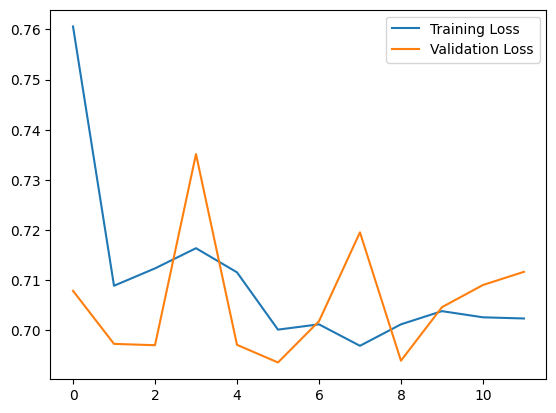

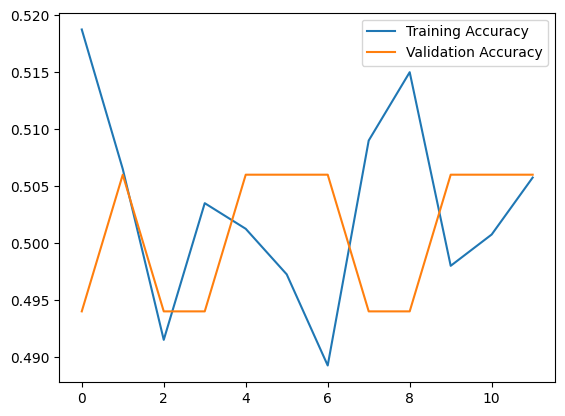

In [28]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_25260\4013021705.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  swin_v2_t.load_state_dict(torch.load('swin_v2_t_s_data.pth')


Accuracy: 0.5040

F1-Score: 0.3378

Precision: 0.2540

Recall: 0.5040


e:\work\Python_venv\ML\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


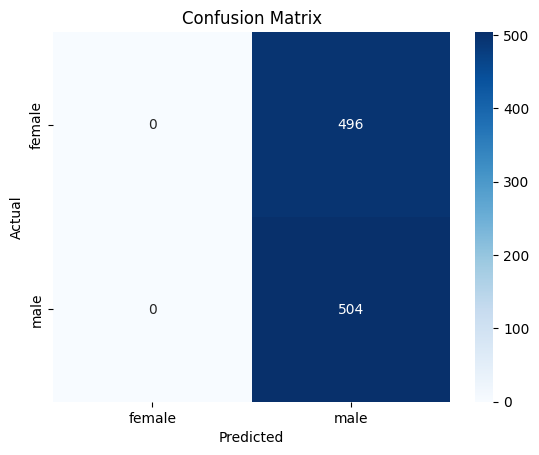

In [29]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
swin_v2_t.load_state_dict(torch.load('swin_v2_t_s_data.pth'))
swin_v2_t.to(device)

swin_v2_t.eval()
all_labels = []
all_predictions = []

with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = swin_v2_t(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

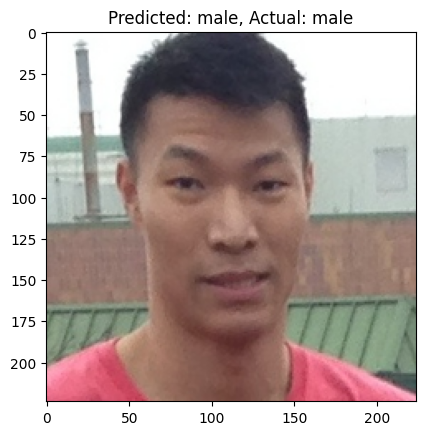

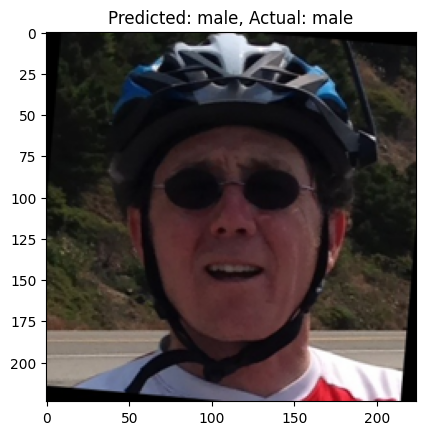

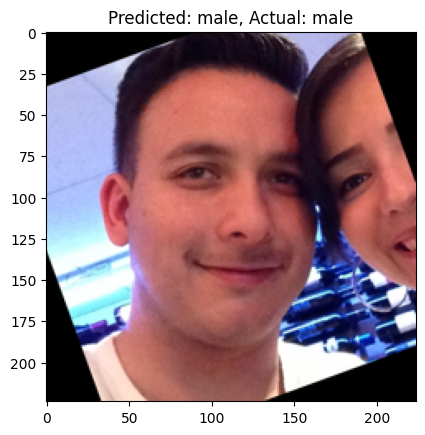

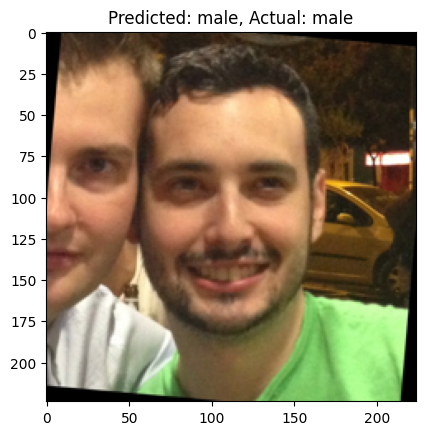

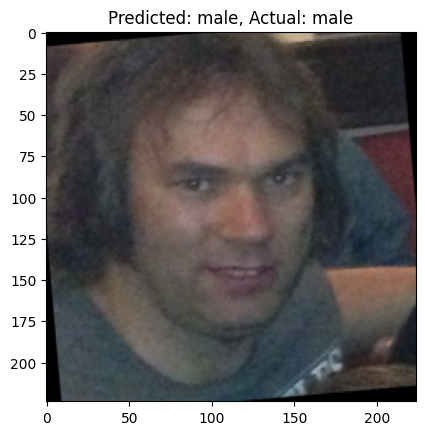

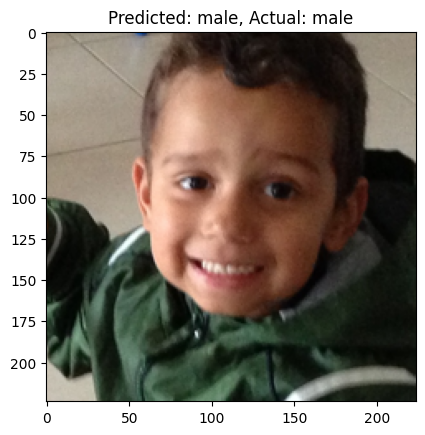

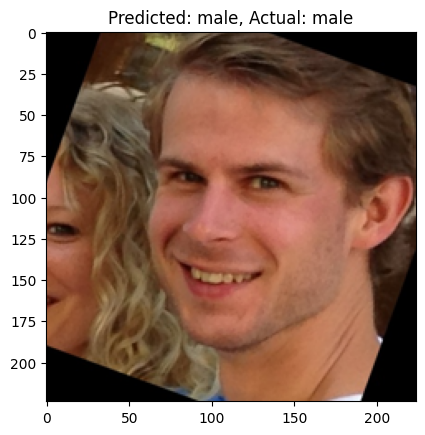

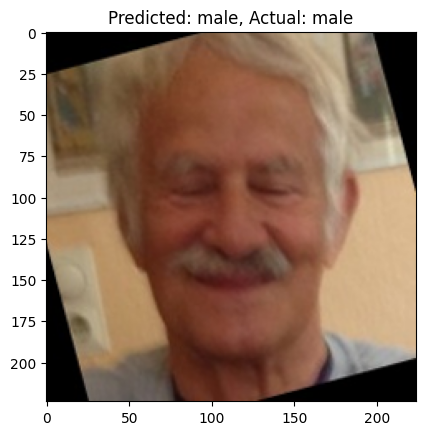

In [30]:
# Show some predictions
swin_v2_t.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = swin_v2_t(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [24]:
# Load pretrained model
from torchvision.models import swin_v2_t, Swin_V2_T_Weights

swin_v2_t = swin_v2_t(weights=Swin_V2_T_Weights.IMAGENET1K_V1)

# Change to 2 classes
swin_v2_t.head = torch.nn.Linear(swin_v2_t.head.in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
swin_v2_t.to(device)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlockV2(
        (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttentionV2(
          (qkv): Linear(in_features=96, out_features=288, bias=True)
          (proj): Linear(in_features=96, out_features=96, bias=True)
          (cpb_mlp): Sequential(
            (0): Linear(in_features=2, out_features=512, bias=True)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=512, out_features=3, bias=False)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=96, out_features=384, bias=True)
          (1): GELU(approximate='

In [25]:
# Check the number of parameters
total_params = sum([param.numel() for param in swin_v2_t.parameters()])
print(f'{total_params:,} total parameters.')

27,584,108 total parameters.


In [26]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(swin_v2_t.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [27]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  swin_v2_t.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = swin_v2_t(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  swin_v2_t.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = swin_v2_t(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(swin_v2_t.state_dict(), 'swin_v2_t_finetune_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.4271, Training Accuracy: 0.7957
Validation Loss: 0.2453, Validation Accuracy: 0.9180
===== Epoch 2 =====
Training Loss: 0.2499, Training Accuracy: 0.8982
Validation Loss: 0.2022, Validation Accuracy: 0.9260
===== Epoch 3 =====
Training Loss: 0.1847, Training Accuracy: 0.9275
Validation Loss: 0.1930, Validation Accuracy: 0.9200
===== Epoch 4 =====
Training Loss: 0.1407, Training Accuracy: 0.9443
Validation Loss: 0.1657, Validation Accuracy: 0.9480
===== Epoch 5 =====
Training Loss: 0.1372, Training Accuracy: 0.9380
Validation Loss: 0.1994, Validation Accuracy: 0.9280
===== Epoch 6 =====
Training Loss: 0.0908, Training Accuracy: 0.9660
Validation Loss: 0.1540, Validation Accuracy: 0.9480
===== Epoch 7 =====
Training Loss: 0.0818, Training Accuracy: 0.9688
Validation Loss: 0.2324, Validation Accuracy: 0.9460
===== Epoch 8 =====
Training Loss: 0.0886, Training Accuracy: 0.9655
Validation Loss: 0.1189, Validation Accuracy: 0.9560
===== Epoch 9 =====
Trai

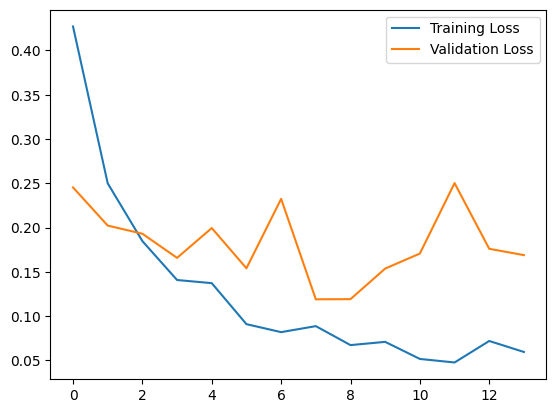

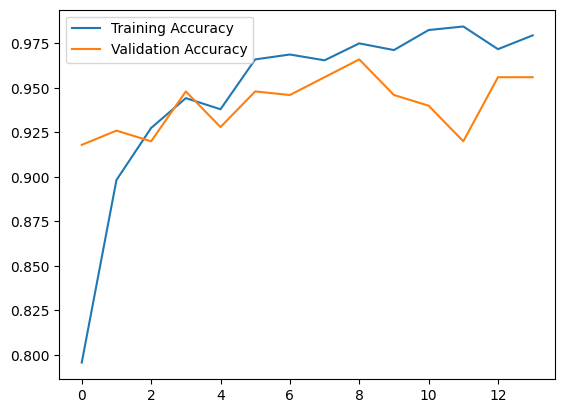

In [28]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_25416\667030491.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  swin_v2_t.load_state_dict(torch.load('swin_v2_t_finetune_s_da


Accuracy: 0.9490

F1-Score: 0.9490

Precision: 0.9491

Recall: 0.9490


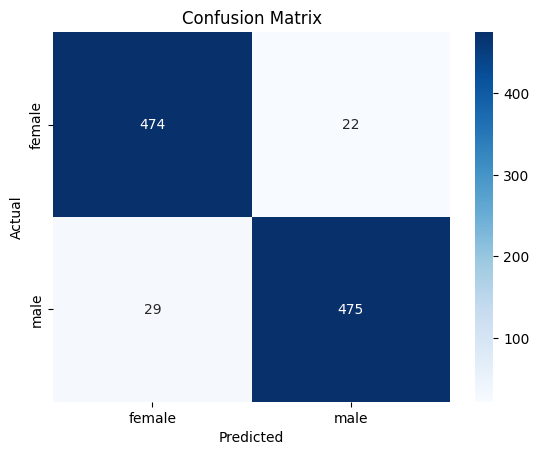

In [29]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
swin_v2_t.load_state_dict(torch.load('swin_v2_t_finetune_s_data.pth'))
swin_v2_t.to(device)

swin_v2_t.eval()
all_labels = []
all_predictions = []

with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = swin_v2_t(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

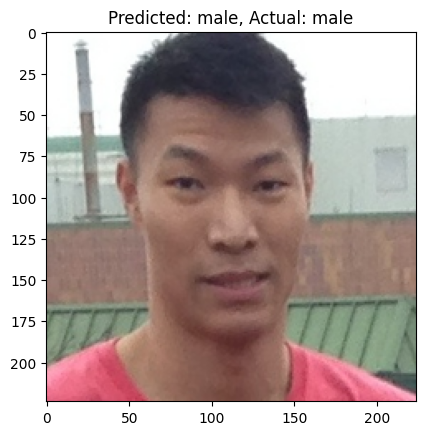

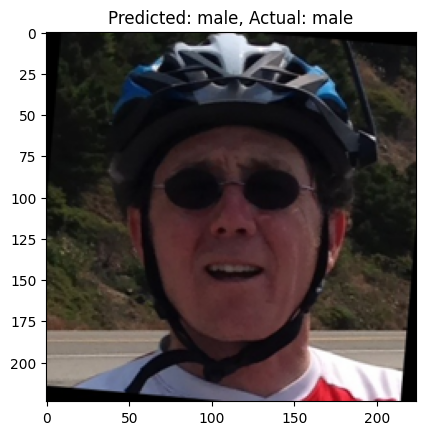

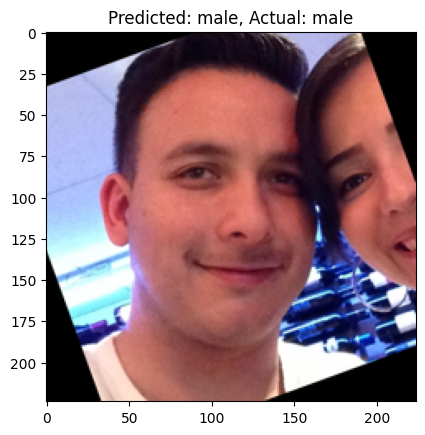

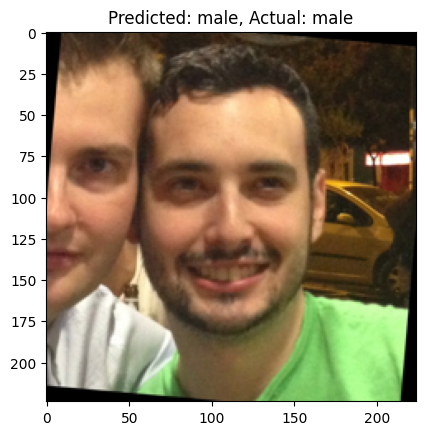

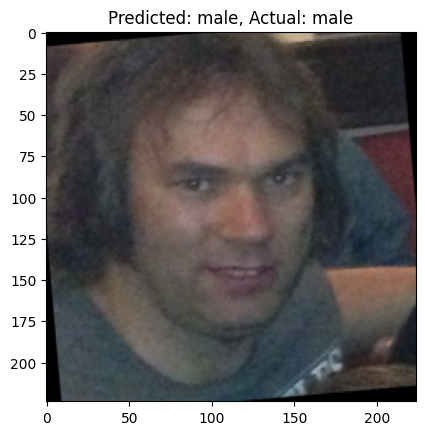

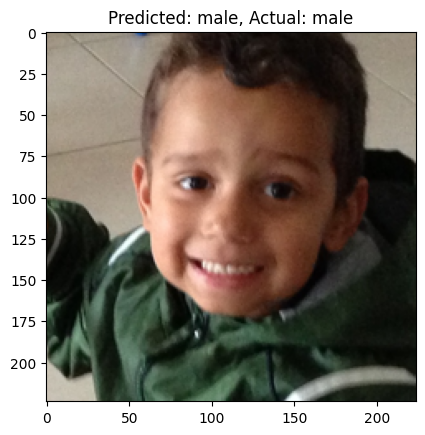

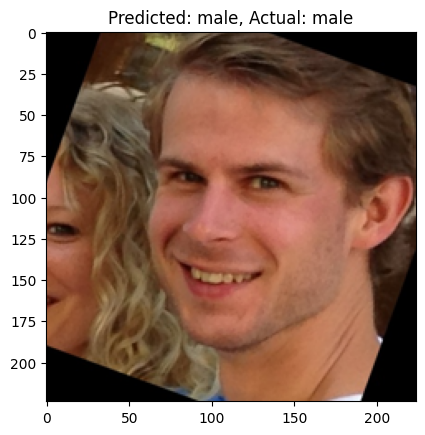

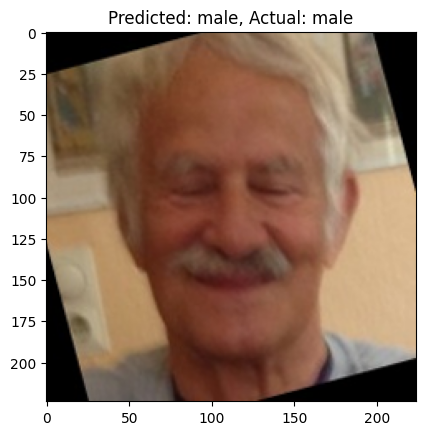

In [30]:
# Show some predictions
swin_v2_t.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = swin_v2_t(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## More Training Data (12000 Train, 1500 Val, Same 1000 Test data)

In [20]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 13500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=6750, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=6750, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    6750
f    6750
Name: count, dtype: int64


In [21]:
# Get train and validation sets (12000-1500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=1500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [22]:
len(train_dataset), len(val_dataset), len(test_dataset)

(12000, 1500, 1000)

In [23]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [24]:
# Load pretrained model
from torchvision.models import swin_v2_t

swin_v2_t = swin_v2_t(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
swin_v2_t.to(device)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlockV2(
        (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttentionV2(
          (qkv): Linear(in_features=96, out_features=288, bias=True)
          (proj): Linear(in_features=96, out_features=96, bias=True)
          (cpb_mlp): Sequential(
            (0): Linear(in_features=2, out_features=512, bias=True)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=512, out_features=3, bias=False)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=96, out_features=384, bias=True)
          (1): GELU(approximate='

In [25]:
# Check the number of parameters
total_params = sum([param.numel() for param in swin_v2_t.parameters()])
print(f'{total_params:,} total parameters.')

27,584,108 total parameters.


In [26]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(swin_v2_t.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [27]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  swin_v2_t.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = swin_v2_t(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  swin_v2_t.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = swin_v2_t(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(swin_v2_t.state_dict(), 'swin_v2_t_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.7242, Training Accuracy: 0.5081
Validation Loss: 0.6951, Validation Accuracy: 0.5107
===== Epoch 2 =====
Training Loss: 0.7060, Training Accuracy: 0.5066
Validation Loss: 0.7028, Validation Accuracy: 0.4960
===== Epoch 3 =====
Training Loss: 0.7039, Training Accuracy: 0.5028
Validation Loss: 0.6941, Validation Accuracy: 0.4960
===== Epoch 4 =====
Training Loss: 0.6989, Training Accuracy: 0.4977
Validation Loss: 0.6958, Validation Accuracy: 0.4960
===== Epoch 5 =====
Training Loss: 0.6978, Training Accuracy: 0.4973
Validation Loss: 0.6975, Validation Accuracy: 0.4960
===== Epoch 6 =====
Training Loss: 0.6978, Training Accuracy: 0.4985
Validation Loss: 0.6941, Validation Accuracy: 0.4960
===== Epoch 7 =====
Training Loss: 0.7002, Training Accuracy: 0.4963
Validation Loss: 0.6931, Validation Accuracy: 0.5040
===== Epoch 8 =====
Training Loss: 0.6968, Training Accuracy: 0.4978
Validation Loss: 0.6932, Validation Accuracy: 0.4960
===== Epoch 9 =====
Trai

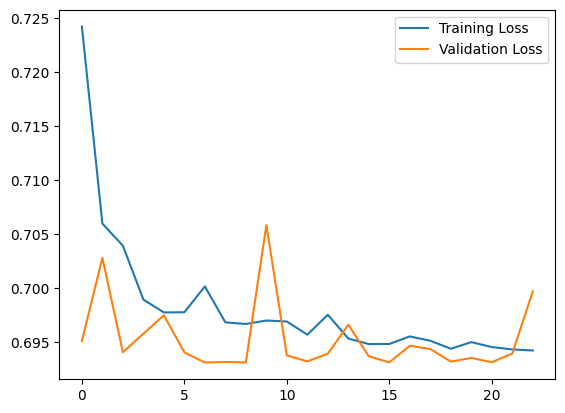

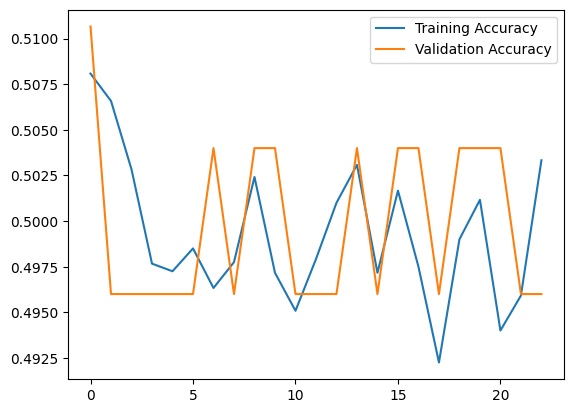

In [28]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_15548\4101584587.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  swin_v2_t.load_state_dict(torch.load('swin_v2_t_l_data.pth')


Accuracy: 0.4960

F1-Score: 0.3289

Precision: 0.2460

Recall: 0.4960


e:\work\Python_venv\ML\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


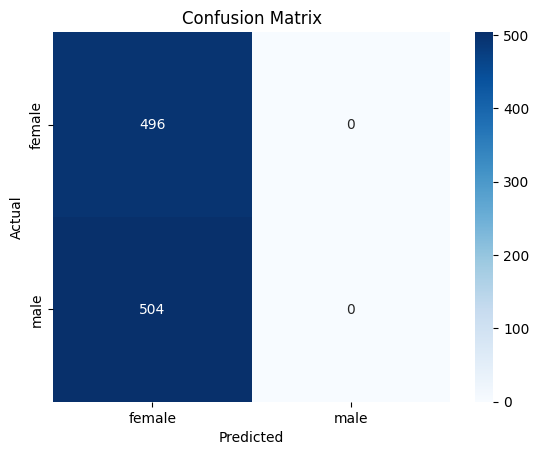

In [29]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
swin_v2_t.load_state_dict(torch.load('swin_v2_t_l_data.pth'))
swin_v2_t.to(device)

swin_v2_t.eval()
all_labels = []
all_predictions = []

with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = swin_v2_t(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

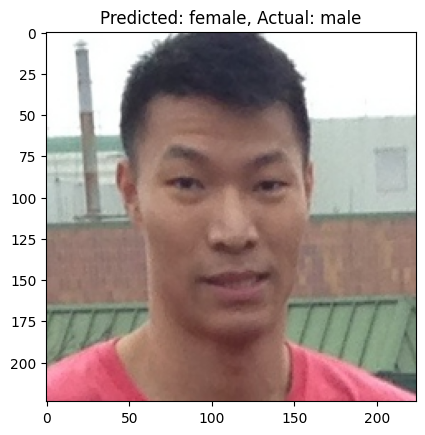

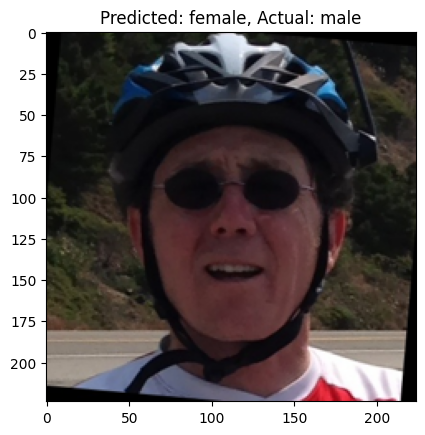

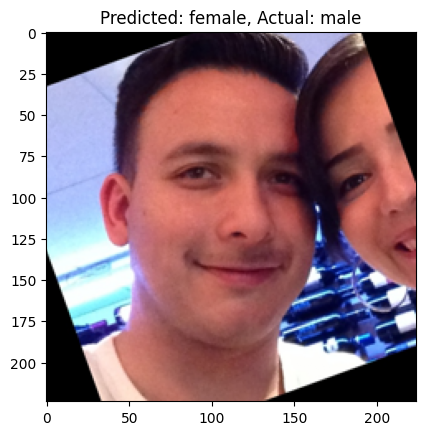

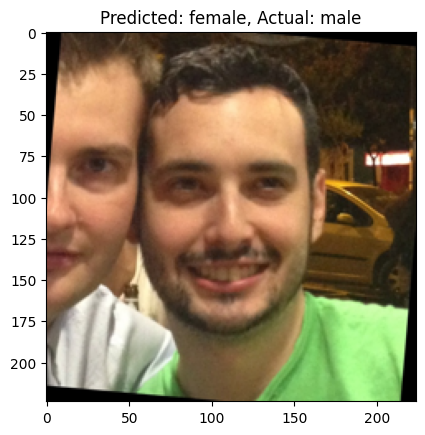

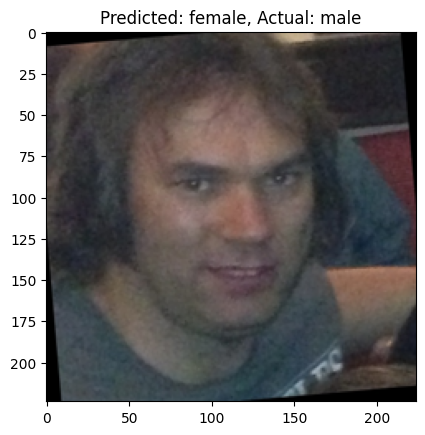

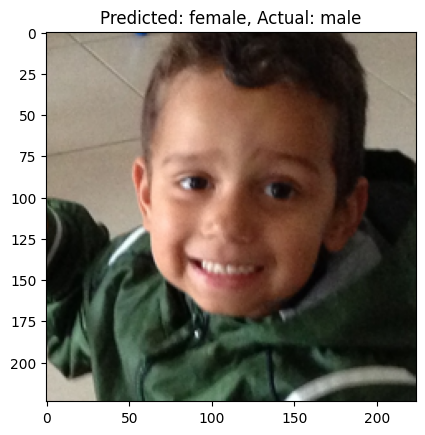

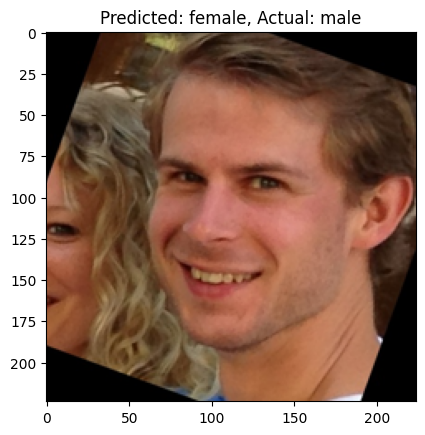

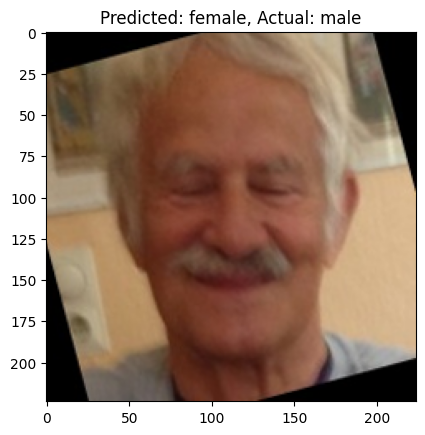

In [30]:
# Show some predictions
swin_v2_t.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = swin_v2_t(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [24]:
# Load pretrained model
from torchvision.models import swin_v2_t, Swin_V2_T_Weights

swin_v2_t = swin_v2_t(weights=Swin_V2_T_Weights.IMAGENET1K_V1)

# Change to 2 classes
swin_v2_t.head = torch.nn.Linear(swin_v2_t.head.in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
swin_v2_t.to(device)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlockV2(
        (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttentionV2(
          (qkv): Linear(in_features=96, out_features=288, bias=True)
          (proj): Linear(in_features=96, out_features=96, bias=True)
          (cpb_mlp): Sequential(
            (0): Linear(in_features=2, out_features=512, bias=True)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=512, out_features=3, bias=False)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=96, out_features=384, bias=True)
          (1): GELU(approximate='

In [26]:
# Check the number of parameters
total_params = sum([param.numel() for param in swin_v2_t.parameters()])
print(f'{total_params:,} total parameters.')

27,584,108 total parameters.


In [27]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(swin_v2_t.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [28]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  swin_v2_t.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = swin_v2_t(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  swin_v2_t.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = swin_v2_t(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(swin_v2_t.state_dict(), 'swin_v2_t_finetune_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.3111, Training Accuracy: 0.8658
Validation Loss: 0.1594, Validation Accuracy: 0.9387
===== Epoch 2 =====
Training Loss: 0.1775, Training Accuracy: 0.9314
Validation Loss: 0.1114, Validation Accuracy: 0.9607
===== Epoch 3 =====
Training Loss: 0.1328, Training Accuracy: 0.9497
Validation Loss: 0.0901, Validation Accuracy: 0.9660
===== Epoch 4 =====
Training Loss: 0.1092, Training Accuracy: 0.9584
Validation Loss: 0.0879, Validation Accuracy: 0.9667
===== Epoch 5 =====
Training Loss: 0.0875, Training Accuracy: 0.9662
Validation Loss: 0.0871, Validation Accuracy: 0.9707
===== Epoch 6 =====
Training Loss: 0.0805, Training Accuracy: 0.9681
Validation Loss: 0.1110, Validation Accuracy: 0.9613
===== Epoch 7 =====
Training Loss: 0.0781, Training Accuracy: 0.9707
Validation Loss: 0.0684, Validation Accuracy: 0.9760
===== Epoch 8 =====
Training Loss: 0.0624, Training Accuracy: 0.9767
Validation Loss: 0.0879, Validation Accuracy: 0.9700
===== Epoch 9 =====
Trai

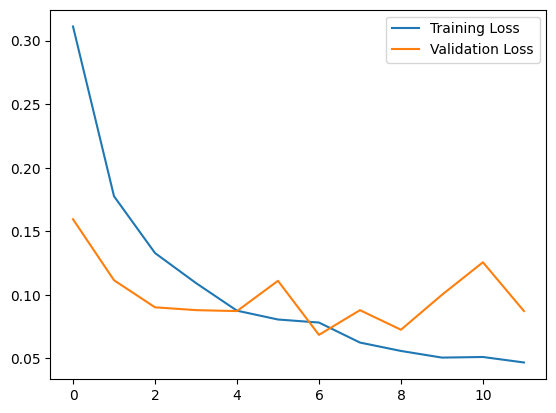

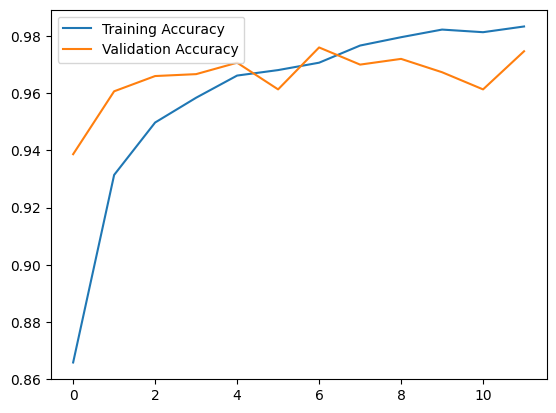

In [29]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_16532\2637213806.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  swin_v2_t.load_state_dict(torch.load('swin_v2_t_finetune_l_d


Accuracy: 0.9730

F1-Score: 0.9730

Precision: 0.9731

Recall: 0.9730


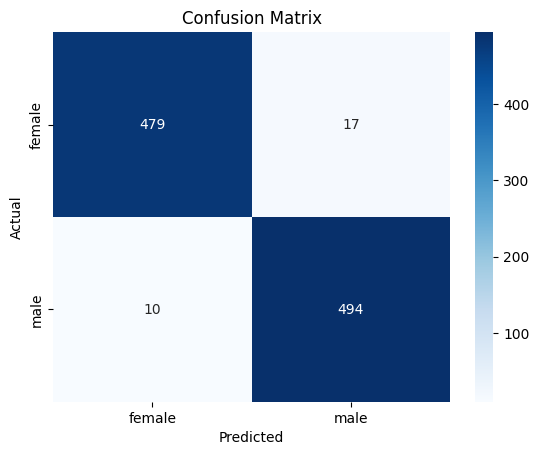

In [30]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
swin_v2_t.load_state_dict(torch.load('swin_v2_t_finetune_l_data.pth'))
swin_v2_t.to(device)

swin_v2_t.eval()
all_labels = []
all_predictions = []

with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = swin_v2_t(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

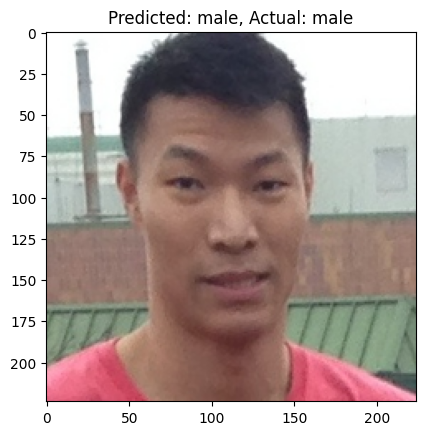

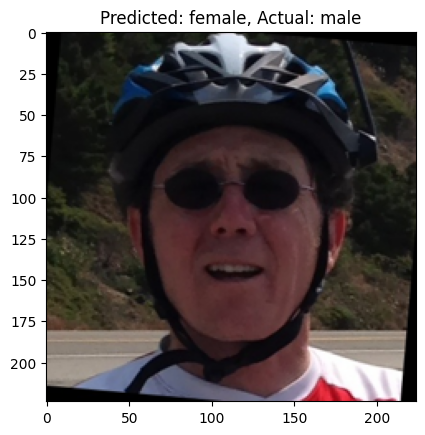

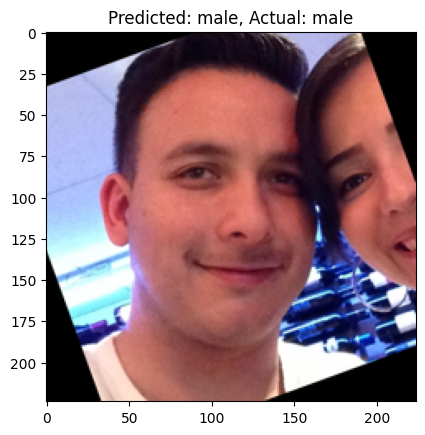

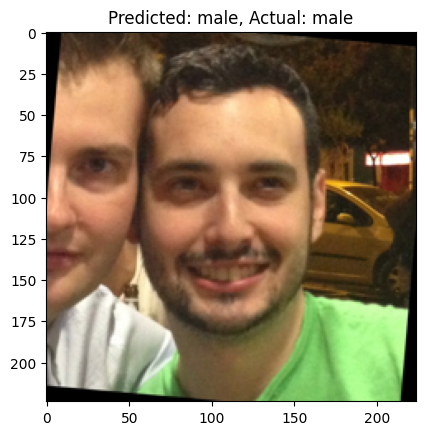

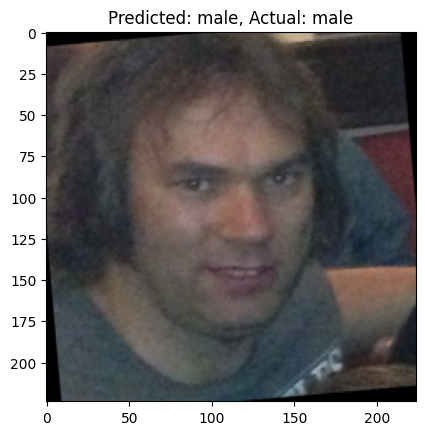

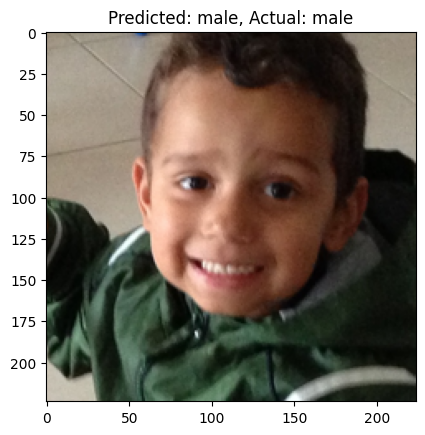

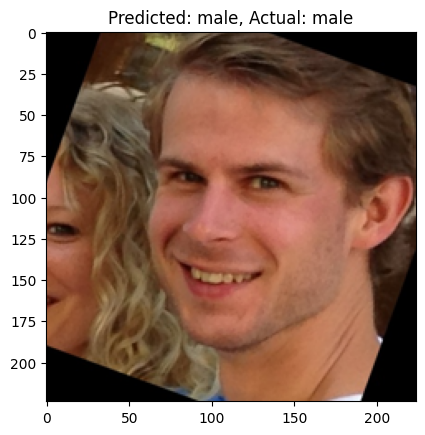

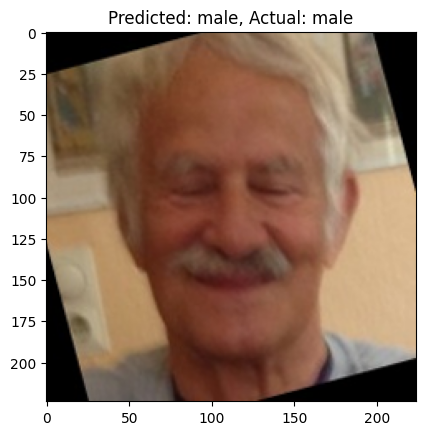

In [31]:
# Show some predictions
swin_v2_t.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = swin_v2_t(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()